[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/JMeneu/Cover-Type-Prediction/blob/main/JPNotebook.ipynb)

# Forest Cover Type Prediction







<img width="600" style="float:left" 
     src="https://images.pexels.com/photos/3923721/pexels-photo-3923721.jpeg?auto=compress&cs=tinysrgb&w=1260&h=750&dpr=2" />








## 0. Context

_In this competition you are asked to predict the forest cover type (the predominant kind of tree cover) from strictly cartographic variables (as opposed to remotely sensed data)._

_The actual forest cover type for a given 30 x 30 meter cell was determined from US Forest Service (USFS) Region 2 Resource Information System data. Independent variables were then derived from data obtained from the US Geological Survey and USFS._

_The data is in raw form (not scaled) and contains binary columns of data for qualitative independent variables such as wilderness areas and soil type._

_This study area includes four wilderness areas located in the Roosevelt National Forest of northern Colorado._ 

_These areas represent forests with minimal human-caused disturbances, so that existing forest cover types are more a result of ecological processes rather than forest management practices._

_+info: <https://www.kaggle.com/competitions/forest-cover-type-prediction/data>_

# 1. Framing the Problem

After checking the documentation provided in the Kaggle competition, we point out the key points from a business perspective:


#### Type of ML System
* **Supervised Learning:** the training set includes the target's labels (Cover Type [1-7]).
* **Batch Learning:** the data provided comes in a .csv format, and date is not expected to be updated regularly. Therefore, the system has all the available data to train and learn from it.
* **Model-based:** the intended approach is to generalize from the training set, with a ML model.

#### Kind of ML Problem
* **Multiclass Classification:** given that our target variable (Cover Type) is a category label-encoded, we want to predict a label, not a number. As there are several types of Cover Type [1-7], its a Multiclass Classification.

#### Perfomance Metric
* **Accuracy:** it's a requirement by the Kaggle competition. Accuracy is one of the most conventional perfomance metrics for multiclass classification is Accuracy. It return a ratio of correct predictions. The following is its formula:


---

_Summary_

* **Goal**: predict Cover Type.
* **Type of ML System**: Supervised Learning/ Batch Learning/ Model Based.
* **Kind of ML Problem**: Multiclass Classification.
* **Performance Metric**: Accuracy

# 2. Obtaining the Data

Let's start off with the data. 

First of all, we have two datasets: 
* `train.csv`
* `test.csv`

As our data is already split for us, we won't bother to split it back again. 

The done split will save us time, and will enable us to explore our `train.csv` without having to worry about biaising our choices.

We first create a function to import our batch training and test data:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from pandas.plotting import scatter_matrix
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegressionCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score



TRAIN_PATH = "./datasets/train.csv"
TEST_PATH = "./datasets/test.csv"
SUBMISSION_PATH = "./results/submission.csv"

def batch_load(path):
    return pd.read_csv(path)

train = batch_load(TRAIN_PATH)
test = batch_load(TEST_PATH)

Our data is now imported: `train` and `test`.
Both of them are _pandas DataFrames_. 

For now, we will forget about the `test` and we will perform an Exploratory Data Analysis on the `train`.

# 3. Exploratory Data Analysis (EDA)

In this step of the Pipeline we will grasp for the first time the substance of our data: we will learn what features are present in our `train`set, check their types and how their values are distributed.

This step is fundamental to set a strategy around the next step, Data Processing.

We will start with the basics. It's always useful to use the `head()` method to see what kind of features and values to expect. 

In [2]:
pd.options.display.max_columns = 100
pd.options.display.max_rows = 100

train.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


Firstly, we see we have lots of features, where some of them are pure numerical features, and others categorical that have been One Hot Encoded for us. Our target variable, Cover Type, is label encoded.

As we usually do, we will have to get rid of the Id feature, as it's irrelevant to our problem, and may intefere in the performance of our final model, introducing noisy data.

---

_Summary_

* Numerical Features: `["Elevation", "Aspect", "Slope", "Horizontal_Distance_To_Hydrology", "Vertical_Distance_To_Hydrology", "Horizontal_Distance_To_Roadways", "Hillshade_9am", "Hillshade_Noon", "Hillshade_3pm", "Horizontal_Distance_To_Fire_Points"] `


* OHE Features: `["Wilderness_Area1", "Wilderness_Area2", "Wilderness_Area3", "Wilderness_Area4", "Soil_Type1", "Soil_Type2", "Soil_Type3", "Soil_Type4", "Soil_Type5", "Soil_Type6", "Soil_Type7", "Soil_Type8", "Soil_Type9", "Soil_Type10", "Soil_Type11", "Soil_Type12", "Soil_Type13", "Soil_Type14", "Soil_Type15", "Soil_Type16", "Soil_Type17", "Soil_Type18", "Soil_Type19", "Soil_Type20", "Soil_Type21", "Soil_Type22", "Soil_Type23", "Soil_Type24", "Soil_Type25", "Soil_Type26", "Soil_Type27", "Soil_Type28", "Soil_Type29", "Soil_Type30", "Soil_Type31", "Soil_Type32", "Soil_Type33", "Soil_Type34", "Soil_Type35", "Soil_Type36", "Soil_Type37", "Soil_Type38", "Soil_Type39", "Soil_Type40"]`


* Label Encoded Features:`["Cover_Type"]`


* Irrelevant Features: `["Id"]`


NOTE: Even though those OHE features are interpreted as numericals, we can't forget its original nature. During the Notebook, we will refer to them like `categorical`even if we are aware of their actual status.

Now, lets have a first glance to some basic statistics of how data is distributed. 

For that, we will use the `describe()` method. 

In [3]:
train.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,15120.00000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.0,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.0,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,7560.50000,2749.322553,156.676653,16.501587,227.195701,51.076521,1714.023214,212.704299,218.965608,135.091997,1511.147288,0.237897,0.033003,0.419907,0.309193,0.023479,0.041204,0.063624,0.055754,0.010913,0.042989,0.0,0.000066,0.000661,0.141667,0.026852,0.015013,0.031481,0.011177,0.0,0.007540,0.040476,0.003968,0.003042,0.009193,0.001058,0.022817,0.050066,0.016997,0.000066,0.003571,0.000992,0.000595,0.085384,0.047950,0.021958,0.045635,0.040741,0.001455,0.006746,0.000661,0.002249,0.048148,0.043452,0.030357,4.000000
std,4364.91237,417.678187,110.085801,8.453927,210.075296,61.239406,1325.066358,30.561287,22.801966,45.895189,1099.936493,0.425810,0.178649,0.493560,0.462176,0.151424,0.198768,0.244091,0.229454,0.103896,0.202840,0.0,0.008133,0.025710,0.348719,0.161656,0.121609,0.174621,0.105133,0.0,0.086506,0.197080,0.062871,0.055075,0.095442,0.032514,0.149326,0.218089,0.129265,0.008133,0.059657,0.031482,0.024391,0.279461,0.213667,0.146550,0.208699,0.197696,0.038118,0.081859,0.025710,0.047368,0.214086,0.203880,0.171574,2.000066
min,1.00000,1863.000000,0.000000,0.000000,0.000000,-146.000000,0.000000,0.000000,99.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,3780.75000,2376.000000,65.000000,10.000000,67.000000,5.000000,764.000000,196.000000,207.000000,106.000000,730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,7560.50000,2752.000000,126.000000,15.000000,180.000000,32.000000,1316.000000,220.000000,223.000000,138.000000,1256.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

The method returns some of the statistics behind a Boxplot, such as the quartiles. It also gives some information around the mean and standard deviation of each feature.

From this we can sense the range of values in which the different features range. We can also check the possibility of Outliers. One possible outlier may reside in the feature `Horizontal_Distance_To_Fire_Points`, as its maximum value falls by far out of the IQR. In the following steps, we will further analyze this possibility.



Just from this method, we can also evaluate other features to be dropped: both `Soil_Type7`and `Soil_Type15`are constantly 0, so they provide no useful information for our model.

---

_Summary_



* Possible Outliers: `["Horizontal_Distance_To_Fire_Points"]`


* Irrelevant Features: `["Soil_Type7", "Soil_Type15"]`

Regarding the count of rows we have per attribute, as also the type of each, using the `info()` method comes quite handy. 

In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15120 entries, 0 to 15119
Data columns (total 56 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   Id                                  15120 non-null  int64
 1   Elevation                           15120 non-null  int64
 2   Aspect                              15120 non-null  int64
 3   Slope                               15120 non-null  int64
 4   Horizontal_Distance_To_Hydrology    15120 non-null  int64
 5   Vertical_Distance_To_Hydrology      15120 non-null  int64
 6   Horizontal_Distance_To_Roadways     15120 non-null  int64
 7   Hillshade_9am                       15120 non-null  int64
 8   Hillshade_Noon                      15120 non-null  int64
 9   Hillshade_3pm                       15120 non-null  int64
 10  Horizontal_Distance_To_Fire_Points  15120 non-null  int64
 11  Wilderness_Area1                    15120 non-null  int64
 12  Wild

We have 56 features, and each of them, 15120 instances (rows). The `info()`method shows that all our features are `integer`, but we must keep in mind some are OHE and other Label-Encoded, as seen before.

One interesting thing we spot is the absence of `NULL` values: this is great, as we won't have to plan out any starategy to fill them in, nor analyzing the cause of its missing (MCAR,MNAR, etc.).

---

_Summary_

* 56 features.
* 15120 instances.
* No `NULL`values.
* All features understood as `integers`, but pay attention to those OHE and label-encoded in future scaling.

Our target is `Cover_Type`. We won't focus too much in it in this stage, but its relevant to check out how balanced/skewed our dataset is, by evaluating the amount of instances we have per `Cover_Type`. 

This information can be retrieved from the `value_counts()`method:

In [5]:
train["Cover_Type"].value_counts()

5    2160
2    2160
1    2160
7    2160
3    2160
6    2160
4    2160
Name: Cover_Type, dtype: int64

Our `train` is balanced! That's some great news, as our performance metric is Accuracy. 

If our dataset had been skewed, we would face with a problem (our results may have shown a fantastic performance just by how unbalanced the target class was, when in reality that same score was a product of having a same-output model).

---

_Summary_

* Balanced `train` when comparing to target class.

Okay, that's enough for raw textual information. Let's visualize our `train` dataset. 

To start off, we will use the pandas `ProfileReport()`method, which gives a good starting point to understand the distribution, correlations and other generic information of our features.


_NOTE: If you do not have the package `pandas-profiling`installed, run the following cell:_

In [6]:
!pip install -U pandas-profiling

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

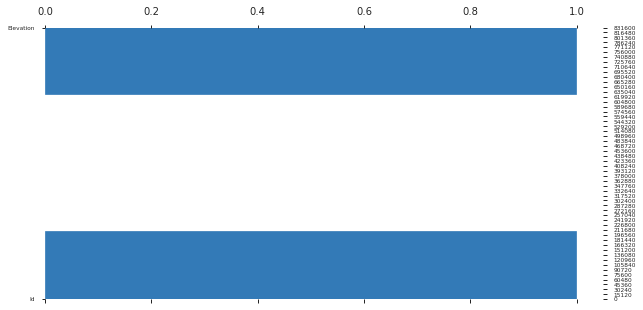

In [7]:
profile = ProfileReport(train)
profile

Wow, that a lots of information in one single cell! Let's analyze it! 

**General**

* Features:	56
* Rows: 15120
* Missing Values: 0

Its interesting to see how Pandas Profile is able to understand if a variable used to be categorical or not:

* Numerical: 12
* Categorical: 44

_NOTE: In this aspect, we tried to understand from their source code (GitHub) how they obtained that specific insight, but that was beyond our understanding. We guessed that, maybe, just by checking the Maximum and Minumum values, we could separate those OHE features. But, in this case, the most simple way to filter them was doing it by hand, as the amount of features is handable._

Let's analyze each feature, one by one:


---

**Features**

_Numerical Features_

* Id: identifyer of the instance (tree).
    + Possible Action: Drop
    
    
    
* Elevation: vertical elevation from sea level, measured in meters.
    + Distribution: not Gaussian, candidate to be Standard Scaled.
    + Correlation: High (to be analyzed in future steps)
    + _Comments: It seems likely the kind of tree will depend on elevation, as elevation plays a role in Soil, Pressure and distance to Hydrology, among others._
    
    
    
* Aspect: angle with respect to the North Axis, measured in degrees.
    + Distribution: not Gaussian, candidate to be Standard Scaled.
    + Correlation: High (to be analyzed in future steps)
    + _Comments: Aspect may be slightly relevant to the tree type, as the ones facing north will be less dry than those facing south._
    + Possible Actions: possible split in ranges
    
    `{
    NORTH: [-22.5º, 22.5º], 
    NORTH-EAST: [22.5º,67.5º], 
    EAST: [67.5°, 112.5°], 
    SOUTH-EAST: [112.5°,157.5°],
    SOUTH: [157.5°, 202.5°], 
    SOUTH-WEST: [202.5°, 247.5°], 
    WEST: [-247.5º, 292.5º], 
    NORTH-WEST: [-292.5º, 337.5º]
    }`

   
 
* Slope: angle with the horizontal plane, tangent to the Earth's surface.
    + Distribution: not Gaussian, candidate to be Standard Scaled.
    + Correlation: High (to be analyzed in future steps)
    + Possible Actions: create new features combined with `Elevation` and `Aspect`, as their combination will give hints for trees in drer areas and more wet areas.
    
    
    
_NOTE:_

_These three variables, don't give enough information to spot a Cartesian point in the space. Ate first our approach was based on using the three as Espherical Coordinates, later on converted to cartesian, to undertsand its position in the space. Nonetheless, that first guess was wrong as the angles do not correpond to such system._

_On the other hand, Latitude and Longitude couldn't be obtained from it either._

_Working with other variables may give us a more general point of view of its distribution in the space._







* Horizontal_Distance_To_Hydrology: horizontal distance to the nearest water source (rivers, lakes...), measured in meters.
    + Distribution: not Gaussian, candidate to be Standard Scaled. 
    + Zeros: more than a 10%. Strange, but not impossible.
    + Outliers: some values far from the 1.5* IQR. May be outliers.
    + Correlation: High (to be analyzed in future steps)
    
    
    
* Vertical_Distance_To_Hydrology: vertical distance to nearest water source, maesured in meters.
    + Distribution: not Gaussian, candidate to be Standard Scaled.
    + Correlation: High (to be analyzed in future steps)
    + Other Insights: some values are negative, which means they may have a river on top of them (in a mountin scenario)
    + Possible Actions: create new features combined with `Horizontal_Distance_To_Hydrology`, with Euclidean/Manhattan distances as starting points.



* Horizontal_Distance_To_Roadways: horizontal distance to a road, in meters.
    + Distribution: not Gaussian, candidate to be Standard Scaled.
    + Correlation: High (to be analyzed in future steps)
    + Possible Actions: create new features combined with `Horizontal_Distance_To_Hydrology`, with Euclidean/Manhattan distances as starting points.
    
    
    
* Hillshade(9am/Noon/3pm): range from [0-255] of the brightness of the zone (shady or sunny zone).
    + Distribution: not Gaussian, candidate to be Standard Scaled.
    + Correlation: High (to be analyzed in future steps)



* Horizontal_Distance_To_Fire_Points: horizontal distance to a firepoints, in meters.
    + Distribution: not Gaussian, candidate to be Standard Scaled.
    + Correlation: High (to be analyzed in future steps)
    + Possible Actions: create new features combined with `Horizontal_Distance_To_Hydrology`, with Euclidean/Manhattan distances as starting points.
    
Remember what we saw in the `describe()`method? 

We originally thought some of the data inside the `Horizontal_Distance_To_Fire_Points` were outliers. We will now plot a box plot to be clear about it:

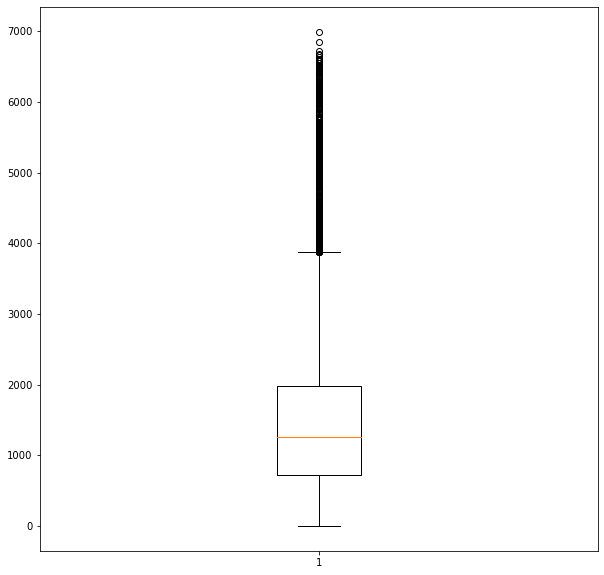

In [8]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize =(10, 10))
plt.boxplot(train["Horizontal_Distance_To_Fire_Points"])
plt.show()

From the BoxPlot we see multiple values out of the 1.5* IQR, but the data seems to be correct, they do not seem anomalous at all. 

Our first approach will be to keep them, as they may be informative. However, if in the end they introduce noise and affect the performance, we will get rid of them.

---

_Categorical Features_

* Wilderness_Area1: area corresponding to the Rawah Wilderness Area
    + Presence: 23.8% of the trees are in this area.
    
    
* Wilderness_Area2: area corresponding to the Neota Wilderness Area
    + Presence: Only 3.3% of the trees are in this area.
    
    
* Wilderness_Area3: area corresponding to the Comanche Peak Wilderness Area
    + Presence: A wapping 42% of the trees are in this area.
    
    
* Wilderness_Area4: area corresponding to the  Cache la Poudre Wilderness Area
    + Presence: 30.9% of the trees are in this area.
    
    

We will show a map to illustrate how they are located:

<img width="600" style="float:center" 
     src="https://i.imgur.com/q4BVccU.png" />

Our `ProfileReport()`can't give us further information on what trees are present on each area. We will make a not fancy yet effective function were we will get the amount of trees of each type, per area:

In [9]:
def coverCounter(areas, train):
    for area in areas:
        for i in range (1,8):
            temp_df = train.pivot(columns="Cover_Type", values =area)
            print(f"{area}: Cat. {i}: {temp_df[i].value_counts().get(1)}")  
        print("\n")
    

areas = ["Wilderness_Area1", "Wilderness_Area2", "Wilderness_Area3" , "Wilderness_Area4"] 
coverCounter(areas, train)

Wilderness_Area1: Cat. 1: 1062
Wilderness_Area1: Cat. 2: 1134
Wilderness_Area1: Cat. 3: None
Wilderness_Area1: Cat. 4: None
Wilderness_Area1: Cat. 5: 856
Wilderness_Area1: Cat. 6: None
Wilderness_Area1: Cat. 7: 545


Wilderness_Area2: Cat. 1: 181
Wilderness_Area2: Cat. 2: 66
Wilderness_Area2: Cat. 3: None
Wilderness_Area2: Cat. 4: None
Wilderness_Area2: Cat. 5: None
Wilderness_Area2: Cat. 6: None
Wilderness_Area2: Cat. 7: 252


Wilderness_Area3: Cat. 1: 917
Wilderness_Area3: Cat. 2: 940
Wilderness_Area3: Cat. 3: 863
Wilderness_Area3: Cat. 4: None
Wilderness_Area3: Cat. 5: 1304
Wilderness_Area3: Cat. 6: 962
Wilderness_Area3: Cat. 7: 1363


Wilderness_Area4: Cat. 1: None
Wilderness_Area4: Cat. 2: 20
Wilderness_Area4: Cat. 3: 1297
Wilderness_Area4: Cat. 4: 2160
Wilderness_Area4: Cat. 5: None
Wilderness_Area4: Cat. 6: 1198
Wilderness_Area4: Cat. 7: None




_Summary:_
* Wilderness_Area1: {1: 1062, 2: 1134, 5: 856, 7: 545}
* Wilderness_Area2: {1: 181, 2:66, 7: 252}
* Wilderness_Area3: {1: 917, 2: 940, 3:863, 5: 1304, 6: 962, 7: 1363}
* Wilderness_Area4: {2: 20, 3: 1297, 4:2160,  6: 1198}

Seen on `matplotlib`:

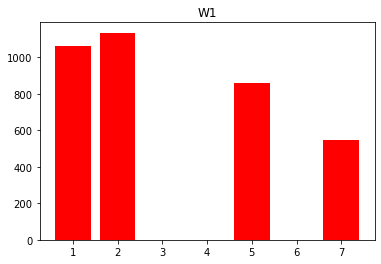

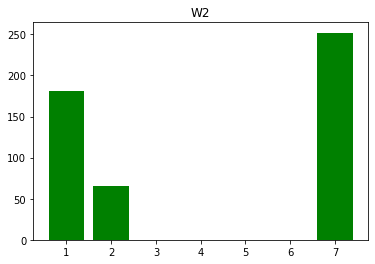

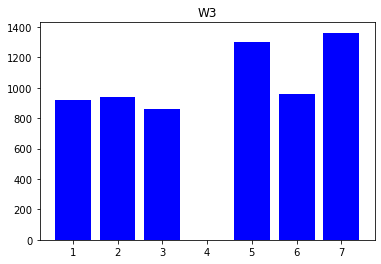

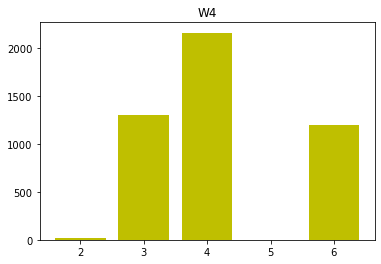

In [10]:
Wilderness_Area1= {1: 1062, 2: 1134, 5: 856, 7: 545}
Wilderness_Area2= {1: 181, 2:66, 7: 252}
Wilderness_Area3= {1: 917, 2: 940, 3:863, 5: 1304, 6: 962, 7: 1363}
Wilderness_Area4= {2: 20, 3: 1297, 4:2160,  6: 1198}

plt.bar(list(Wilderness_Area1.keys()), Wilderness_Area1.values(), color='r')
plt.title("W1")
plt.show()
plt.bar(list(Wilderness_Area2.keys()), Wilderness_Area2.values(), color='g')
plt.title("W2")
plt.show()
plt.bar(list(Wilderness_Area3.keys()), Wilderness_Area3.values(), color='b')
plt.title("W3")
plt.show()
plt.bar(list(Wilderness_Area4.keys()), Wilderness_Area4.values(), color='y')
plt.title("W4")
plt.show()

From this we get different insights:

* Cover_Type 1 is present in W1/W2/W3, and its similar to Cover_Type 2.
* Cover_Type 2 is present on W1/W2/W3 and slightly in W4.
* Cover_Type 3 is only present on W3/W4
* Cover_Type 4 is only present on W4
* Cover_Type 5 is only present on W1/W3
* Cover_Type 6 is only present on W3/W4
* Cover_Type 7 is present on W1/W2/W3

This information may be useful for the future.

Lets move on to the next categorical feature:

* Soil_Types: kind of soil of each tree.
    + Possible Actions: dropping Soil_Type7 and Soil_Type15.
    + Possible Actions: dropping soils with less than a 10% presence per category.
    + Possible Actions: clustering them into similar Families
    
    Lets analyze further this last point, with the following function:

In [11]:
def soilPresence(train, threshold):
    '''
    Checks out the relevance of Soils, according to a threshold, and returns a list of the irrelevant ones.
    '''
    soil_types =["Soil_Type1", "Soil_Type2", "Soil_Type3", "Soil_Type4", "Soil_Type5", "Soil_Type6", "Soil_Type7", "Soil_Type8", "Soil_Type9", "Soil_Type10", "Soil_Type11", "Soil_Type12", "Soil_Type13", "Soil_Type14", "Soil_Type15", "Soil_Type16", "Soil_Type17", "Soil_Type18", "Soil_Type19", "Soil_Type20", "Soil_Type21", "Soil_Type22", "Soil_Type23", "Soil_Type24", "Soil_Type25", "Soil_Type26", "Soil_Type27", "Soil_Type28", "Soil_Type29", "Soil_Type30", "Soil_Type31", "Soil_Type32", "Soil_Type33", "Soil_Type34", "Soil_Type35", "Soil_Type36", "Soil_Type37", "Soil_Type38", "Soil_Type39", "Soil_Type40"]
    types =[1,2,3,4,5,6,7]
    my_dict={}
    droppable =[]
    for soil in soil_types: 
        tot =0
        for i in types:
            try:
                val =train[soil].loc[train['Cover_Type'] == i].value_counts()[1]
                tot += val
            except:
                continue
        my_dict.update({(soil):(tot)})


    for key, value in my_dict.items():
        if value<threshold*2160:
            droppable.append(key)  
    return droppable

irrelevant_soils = soilPresence(train, 0.1)
print(f"Soils with less than a 10% of presence [{len(irrelevant_soils)}]:\n\n{irrelevant_soils}")

Soils with less than a 10% of presence [19]:

['Soil_Type5', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37']


Now that's a lot of soils that may be introducing noisy data! 

We may even cluster them in the future, by checking its correlations. This would make sense, as lots of these Soils are part of the same family, and have similarities in between them. However, this may constrain even further our differences between targets, so maybe it's a bad idea. We will check it anyways.


Speaking of correlations, lets have a look at them.


---

_Checking Correlations_

The `ProfileReport()` correlation matrix is tiny, as we have too many features to plot. 

We will create a new one, and just paying attention to the `numerical` features, to make it easier to visualize:

<AxesSubplot:>

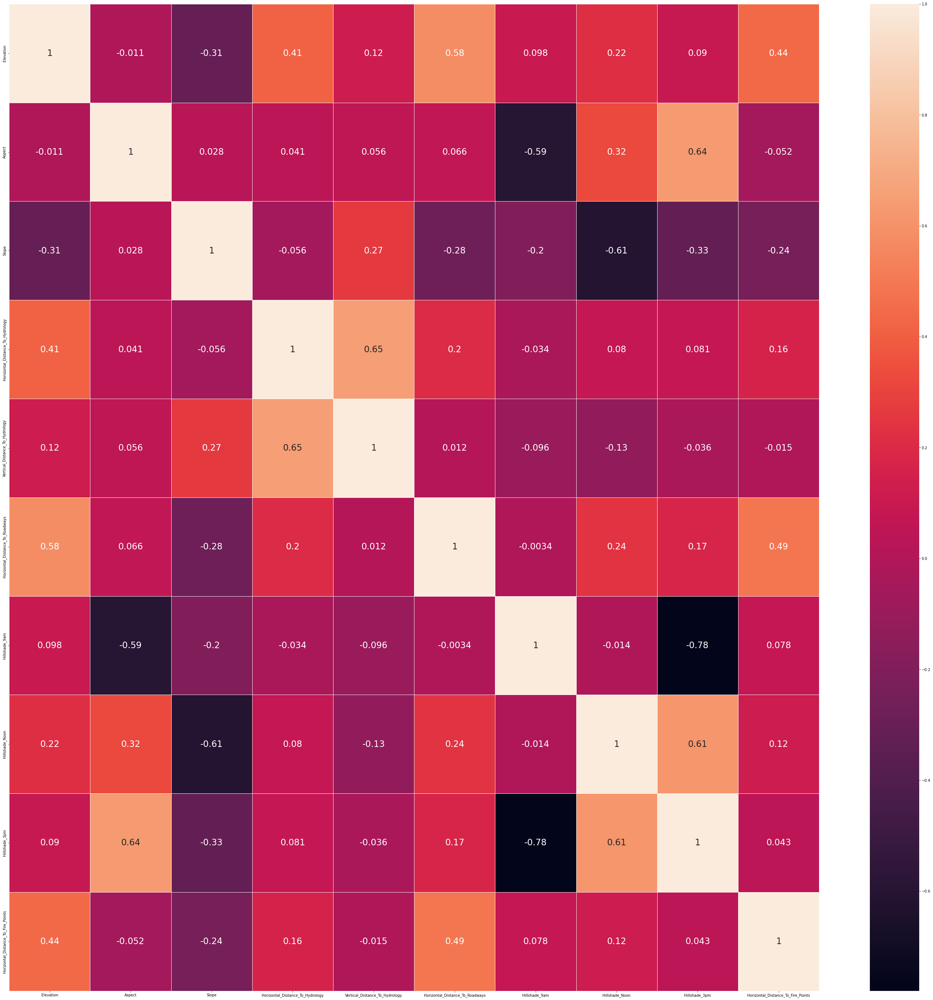

In [12]:
numerical = ["Elevation", "Aspect", "Slope", 
             "Horizontal_Distance_To_Hydrology", 
             "Vertical_Distance_To_Hydrology", 
             "Horizontal_Distance_To_Roadways", 
             "Hillshade_9am", "Hillshade_Noon", 
             "Hillshade_3pm", 
             "Horizontal_Distance_To_Fire_Points"]

corr_matrix = train[numerical].corr()
fig, ax = plt.subplots(figsize=(50,50))         
sns.heatmap(corr_matrix, annot=True, linewidths=.5, ax=ax, annot_kws={"fontsize":24})

Looking at the above correlation matrix we can see that there is some medium/high correlations between our numerical values in our train dataset. 

From this correlation matrix we will be using it in helping us create to create extra explanatory variables that might help explain our model.

_Numerical_

* `Hillshade_9am and Hillshade_3pm` [-0.78]
* `Horizontal_Distance_To_Hydrology and Vertical_Distance_To_Hydrology `[0.65]  
* `Aspect and Hillshade_3pm `[0.64]  
* `Hillshade_Noon and Hillshade_3pm `[0.61]  
* `Slope and Hillshade_Noon`[-0.61] 


Now, let's do the same in between the OHE `categorical`features:

<AxesSubplot:>

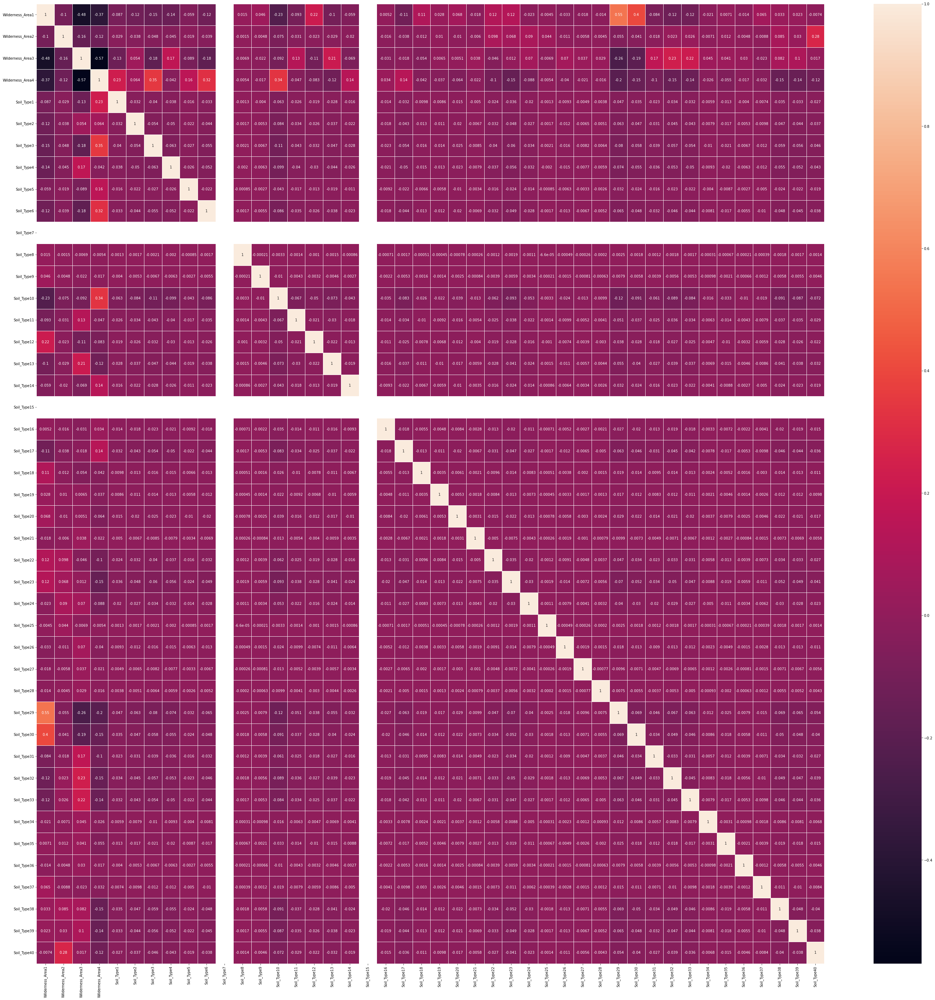

In [13]:
categorical = ["Wilderness_Area1", "Wilderness_Area2", "Wilderness_Area3", 
               "Wilderness_Area4", "Soil_Type1", "Soil_Type2", "Soil_Type3", 
               "Soil_Type4", "Soil_Type5", "Soil_Type6", "Soil_Type7", 
               "Soil_Type8", "Soil_Type9", "Soil_Type10", "Soil_Type11", 
               "Soil_Type12", "Soil_Type13", "Soil_Type14", "Soil_Type15", 
               "Soil_Type16", "Soil_Type17", "Soil_Type18", "Soil_Type19", 
               "Soil_Type20", "Soil_Type21", "Soil_Type22", "Soil_Type23", 
               "Soil_Type24", "Soil_Type25", "Soil_Type26", "Soil_Type27", 
               "Soil_Type28", "Soil_Type29", "Soil_Type30", "Soil_Type31", 
               "Soil_Type32", "Soil_Type33", "Soil_Type34", "Soil_Type35", 
               "Soil_Type36", "Soil_Type37", "Soil_Type38", "Soil_Type39", 
               "Soil_Type40"]

corr_matrix = train[categorical].corr()
fig, ax = plt.subplots(figsize=(50,50))         
sns.heatmap(corr_matrix, annot=True, linewidths=.5, ax=ax)

From the above correlations matrix, we could have planned out some possible future combinations. But, as we can see, most of the correlations in between `Soil_Types`are weak, and only with some `Wilderness_Areas`are higher. 


So, no luck for us: the correlations matrix will not be enough to plan out our categorical features handling.
We will try out to check the correlations against the target.

If we only pay attention to our target variable:

In [14]:
corr_matrix = train.corr()
corr_matrix["Cover_Type"].sort_values(ascending = False)

Cover_Type                            1.000000
Soil_Type38                           0.257810
Soil_Type39                           0.240384
Soil_Type40                           0.205851
Soil_Type10                           0.128972
Wilderness_Area3                      0.122146
Soil_Type35                           0.114327
Id                                    0.108363
Slope                                 0.087722
Wilderness_Area4                      0.075774
Vertical_Distance_To_Hydrology        0.075647
Soil_Type37                           0.071210
Soil_Type17                           0.042453
Soil_Type13                           0.040528
Soil_Type5                            0.027692
Soil_Type36                           0.025726
Soil_Type2                            0.022627
Soil_Type14                           0.022019
Elevation                             0.016090
Soil_Type1                            0.015069
Wilderness_Area2                      0.014994
Soil_Type11  

Now we can see some usful information related to the OHE categorical features! We see that some `Soil_Types` are highly correlated to our target. As it was mentioned before, maybe we can generate clusters of them. We will see later how this works out.

All this information is fine, but: we must take this with a pinch of salt, as not only these are only Pearson's R coefficient (linear correlations), but they are prone to change with the needed Feature Generation. 

From this point of view, we may be tempted to discard the future usage of PCA, as there are not many features highly correlated to each other.  This concept will be analyzed further in the future.

To analyze further combinations of `numerical` features we can check, in a `scatter_matrix()` from `pandas` any kind of patter that may be translated into combinated features:

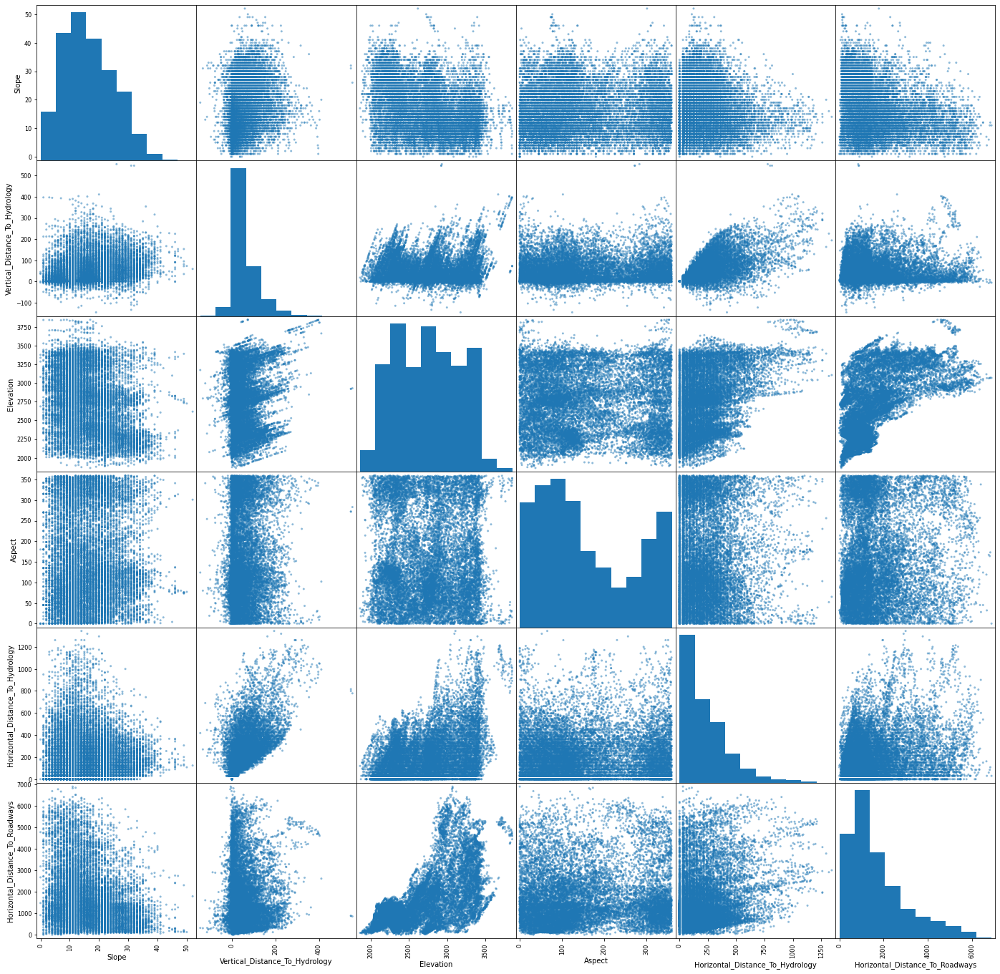

In [15]:
numerical = ["Slope", "Vertical_Distance_To_Hydrology", "Elevation","Aspect", "Horizontal_Distance_To_Hydrology","Horizontal_Distance_To_Roadways"]
scatter_matrix(train[numerical], figsize = (24, 24));

As the matrix is symmetrical, we may pay attention to just one of the sides of the diagonal.

Attending to it, we can further reinforce that `Vertical_Distance_To_Hydrology ` & `Horizontal_Distance_To_Hydrology ` may have a relation.

To finish with this extensive EDA, we will try to plot how our Cover_Types are dispersed along different features.

<AxesSubplot:xlabel='Horizontal_Distance_To_Hydrology', ylabel='Elevation'>

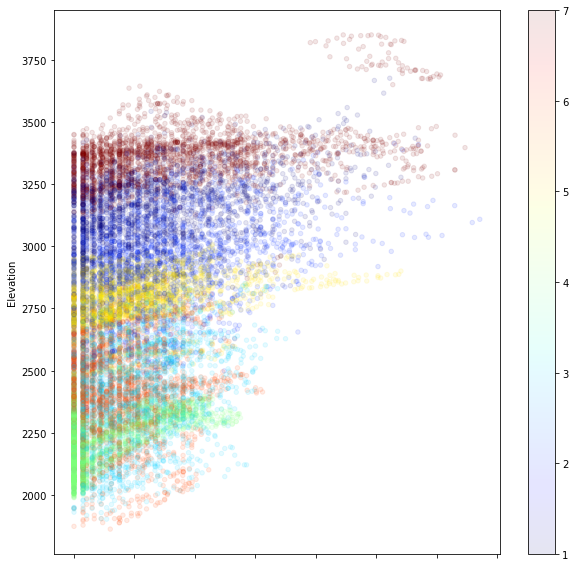

In [16]:
train.plot(kind = "scatter", x="Horizontal_Distance_To_Hydrology",y="Elevation", c =train["Cover_Type"], cmap = plt.get_cmap("jet"), alpha =0.1, figsize =(10,10))

This is interesting, as we can even see that `Elevation` plays a relevant role. Clearly the categories depend on it. However, these features do not show a perfect split in classes. The X variable, the `Horizontal_Distance_To_Hydrology`didn't give much relevant information. We will try with other variables.

We can, temporary, perform a transformation in our Slope variable, to have another possibility to visualize our data.

Using trigonometry, we know the following:

<img width="600" style="float:left" 
     src="https://www.intmath.com/plane-analytic-geometry/img/inclination.gif" />




Therefore, we can calculate the x position of each point:

<AxesSubplot:xlabel='Adjacent', ylabel='Elevation'>

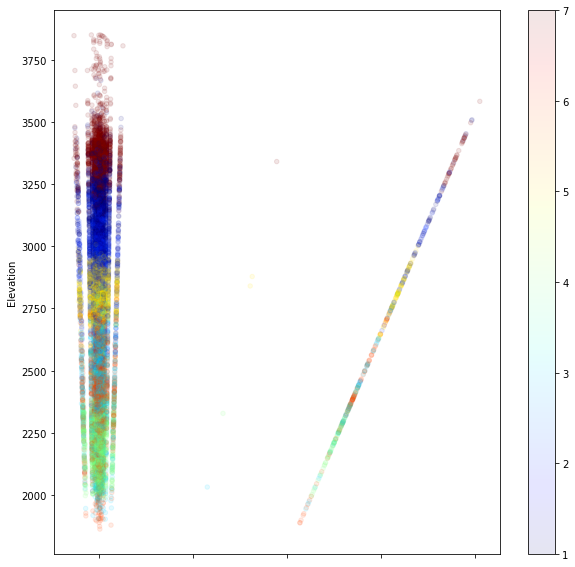

In [17]:
copy_train = train.copy()
copy_train["Adjacent"] = copy_train["Elevation"]/np.tan(copy_train["Slope"])

copy_train.plot(kind = "scatter", x="Adjacent",y="Elevation", c =train["Cover_Type"], cmap = plt.get_cmap("jet"), alpha =0.1, figsize =(10,10))

NOTE: Using the `copy()`method is necesary, as just by reassigning the dataFrame we won't copy the value (pass by value) but the reference of it (pass as reference). Therefore, if we just assign it, the changes we perform in the 'copy', will be reflected in the original one!

Now the target variable seems to be easier to identifiy. Maybe this newly created feature is useful in the following steps.


Few! That was an intense EDA. However, we got very interesting insights from it. 

We saw how data is distributed, the missing values, and some relevant information for Feature Engineering: we can exclude some irrelevant features, combine our numericals in various different ways, and even derive OHE features from numerical ones, as we mentioned with `Aspect`.



---


_Summary_

* Missing Values: None


* Outliers: `["Horizontal_Distance_To_Fire_Points"]`, `Horizontal_Distance_To_Hydrology]`


* OHE: Done


* Feature Extraction: 
    + **`Numerical`**: `["Id", "Aspect"]`
    + **`Categorical`**(10% threshold): `['Soil_Type5', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37']`
    
    
* Feature Generation: 
    + **`Numerical`**: `["Euclidean_Hydrology", "Manhattan_Hydrology", "Elevation_Vertical_Hydrology", "Horizontal_Hydrology_FirePoints", "Adjacent", "Horizontal_Hydrology_minusFirePoints", "Horizontal_Hydrology_minusRoad"]`
    + **`Categorical`**: `["Soil_Cluster1", "Soil_Cluster2", "Soil_Cluster3", "Soil_Cluster4", "North", "North-East", "East", "South-East", "South", "South-West", "West", "North-West"]`
    
    

* Scaling: Standard Scaling on `Numerical`

# 4. Data Processing

So, we've seen a lot in this `train` set. We saw the amount of features, how they are distributed, the irrelevancy of some, and the possible future combinations that might be useful.

Now it's time to take action, and implement the strategies we planned in the previous step!


A good starting point could have been separating both categorical and numerical features. Our strategies may change depending on the type of feature we are treating (scaling, feature generation, etc.).

Nonetheless, we will perform this as the last step, as we will create both `numerical`and `categorical`features.

Lets go on with the Data Cleaning checklist:

### _Missing Values_

We saw no Missing values at all. Threfore, we won't need to use any kind of `Imputer`, nor introduce it in our Transformation Pipeline.

### _Outliers_

The only probable outliers were present in the `Horizontal_Distance_To_Fire_Points`. After checking again our original assumption, we conclude the data is not anomalous and should be kept, as it may be informative to the model.

### _One-Hot-Encoding_

All the original categorical feature have already been OHE'd for us. However, in the EDA we were debating on transforming a `numerical`feature, `Aspect`into a `categorical`OHE feature.

This falls inside the `Feature Engineering` field, so we will discuss in a while.



### _Feature Generation_

In this stage, creativity and logic must work together, as we have no expertise in the field. In the past, Feature Generation was automated by creating `Polynomial Features`, but making use of this concept only augmented the noise in our set.

Anyways, lets go on with Feature Generation:

* `Numerical`

We saw some interesting correlations in the EDA. The `Distance_To_Hydrology` was one of the candidates for feature generation, both in its Euclidean and Manhattan form. 

Other features come from common sense, as it seems the dryness of the zones may be relevant for the kind of tree, and therefore, mixing the distance to Hydrology with the distance to FirePoints make sense. We will also play with other numerical features, such as de distance to Roadways. Maybe these combinations give our model more information to distinguish in between our `target`.

Others such as `Adjacent` may be useful, as they provide a slight change in the `Slope`.

`["Euclidean_Hydrology", "Manhattan_Hydrology", "Elevation_Vertical_Hydrology", "Elevation_minusVertical_Hydrology", "Horizontal_Hydrology_FirePoints", 
"Horizontal_Hydrology_minusFirePoints", "Adjacent","Horizontal_Road_FirePoints", 
"Horizontal_Road_minusFirePoints", "Horizontal_Hydrology_minusRoad","Horizontal_Hydrology_Road"]`

* `Categorical` 

For the categoricals, at the present moment, only clusters of soils will be performed, to maximize it's correlation to the target. In the future, maybe creating a OHE version of `Aspect` may be highly relevant.

NOTE: Creating cluster of soils was a bad idea. In fact, it constrained even more the chances to distinguish in between already too similar targets. Therefore, it will not be implemented in the final model.


We will generate each of them individually:

In [18]:
# Numericals

def numericalGeneration(train):
    '''
    Generates new numerical features.
    
    
    
    
    Executes a lite version of Polynomial Features, for our numerical ones. 
    Returns a DataFrame with new features, derived from basic mathematical
    combinations: adding, substracting, trigonometry, and Geometry.
    '''
    train["Euclidean_Hydrology"] = np.sqrt(train["Horizontal_Distance_To_Hydrology"]**2 + train["Vertical_Distance_To_Hydrology"]**2)
    train["Manhattan_Hydrology"] = train["Horizontal_Distance_To_Hydrology"] + train["Vertical_Distance_To_Hydrology"]
    train["Elevation_Vertical_Hydrology"] = train["Elevation"] + train["Vertical_Distance_To_Hydrology"]
    train["Elevation_minusVertical_Hydrology"] = train["Elevation"] - train["Vertical_Distance_To_Hydrology"]
    train["Horizontal_Hydrology_FirePoints"] = train["Horizontal_Distance_To_Hydrology"] + train["Horizontal_Distance_To_Fire_Points"]
    train["Horizontal_Hydrology_minusFirePoints"] = train["Horizontal_Distance_To_Hydrology"]-train["Horizontal_Distance_To_Fire_Points"]
    train["Adjacent"] = np.divide(train["Elevation"]+0.01,np.tan(train["Slope"])+0.01)
    train["Horizontal_Road_FirePoints"] = train["Horizontal_Distance_To_Roadways"]+train["Horizontal_Distance_To_Fire_Points"]
    train["Horizontal_Road_minusFirePoints"] = train["Horizontal_Distance_To_Roadways"]-train["Horizontal_Distance_To_Fire_Points"]
    train["Horizontal_Hydrology_minusRoad"] = train["Horizontal_Distance_To_Hydrology"]-train["Horizontal_Distance_To_Roadways"]
    train["Horizontal_Hydrology_Road"] = train["Horizontal_Distance_To_Hydrology"]+train["Horizontal_Distance_To_Roadways"]
    return train




# Categoricals

def categoricalGeneration(train):
    '''
    Generates new categorical OHE features.
    
    First, clusters Soil_Types based on the similarities observed during EDA.
    Then, derives a OHE version of the Aspect feature.
    '''
    
    soil_cluster_1 = ["Soil_Type22", "Soil_Type23", "Soil_Type24", "Soil_Type29","Soil_Type30", "Soil_Type31", "Soil_Type32", "Soil_Type33"]
    soil_cluster_2=["Soil_Type1", "Soil_Type2", "Soil_Type3", "Soil_Type4", "Soil_Type6","Soil_Type10"]
    soil_cluster_3 = ["Soil_Type38", "Soil_Type39", "Soil_Type40"]
    soil_cluster_4 = ["Soil_Type11","Soil_Type12", "Soil_Type13", "Soil_Type17"]
    train["Soil_Cluster_1"]=0
    train["Soil_Cluster_2"]=0
    train["Soil_Cluster_3"]=0
    train["Soil_Cluster_4"]=0
    for soil in soil_cluster_1:
        train = train.assign(Soil_Cluster_1 =lambda x: x[soil] + x.Soil_Cluster_1)

    for soil in soil_cluster_2:
        train = train.assign(Soil_Cluster_2 =lambda x: x[soil] + x.Soil_Cluster_2) 

    for soil in soil_cluster_3:
        train = train.assign(Soil_Cluster_3 =lambda x: x[soil] + x.Soil_Cluster_3) 

    for soil in soil_cluster_4:
        train = train.assign(Soil_Cluster_4 =lambda x: x[soil] + x.Soil_Cluster_4)
    
    train = train.drop(soil_cluster_1+soil_cluster_2+soil_cluster_3+soil_cluster_4, axis = 1)
    
    train["NORTH"]=0
    train["NORTH-EAST"]=0
    train["EAST"]=0
    train["SOUTH-EAST"]=0
    train["SOUTH"]=0
    train["SOUTH-WEST"]=0
    train["WEST"]=0
    train["NORTH-WEST"]=0

    for i, aspect in enumerate(train["Aspect"]):
        
        if aspect>=337.5 or aspect<22.5:
            train.at[i,"NORTH"]=1 
        if aspect>=22.5 and aspect<67.5:
            train.at[i,"NORTH-EAST"]=1 
        if aspect>=67.5 and aspect<112.5:
            train.at[i,"EAST"]=1 
        if aspect>=112.5 and aspect<157.5:
            train.at[i,"SOUTH-EAST"]=1 
        if aspect>=157.5 and aspect<202.5:
            train.at[i,"SOUTH"]=1
        if aspect>=202.5 and aspect<247.5:
            train.at[i,"SOUTH-WEST"]=1 
        if aspect>=247.5 and aspect<292.5:
            train.at[i,"WEST"]=1 
        if aspect>=292.5 and aspect<337.5:
            train.at[i,"NORTH-WEST"]=1             
    train = train.drop(["Aspect"], axis =1)
    
    return train

In [19]:
train = numericalGeneration(train)
#train = categoricalGeneration(train) # Won't be executed, not useful for the model

### _Feature Extraction_

To proceed with the Feature Extraction, it's relevant to check how our correlations to the target have changed:

In [20]:
corr_matrix = train.corr()
corr_matrix["Cover_Type"].sort_values(ascending = False)

Cover_Type                              1.000000
Soil_Type38                             0.257810
Soil_Type39                             0.240384
Soil_Type40                             0.205851
Soil_Type10                             0.128972
Wilderness_Area3                        0.122146
Soil_Type35                             0.114327
Id                                      0.108363
Horizontal_Hydrology_minusRoad          0.106104
Horizontal_Hydrology_minusFirePoints    0.088457
Slope                                   0.087722
Wilderness_Area4                        0.075774
Vertical_Distance_To_Hydrology          0.075647
Soil_Type37                             0.071210
Soil_Type17                             0.042453
Soil_Type13                             0.040528
Soil_Type5                              0.027692
Elevation_Vertical_Hydrology            0.026434
Soil_Type36                             0.025726
Soil_Type2                              0.022627
Soil_Type14         

In this field there is definitely room for improvement. We have too many irrelevant features:

* Numerical

For the `numerical ` features, we must get rid of one irrelevant feature: `Id`

I the end, we will not get rid of `Aspect`, we saw creating a OHE version of it wasn't useful for the model.


* Categorical

Straight out of the way, we can discard two `categorical`features, as they are constantly 0:
+ `Soil_Type7`
+` Soil_Type15`

Now, as we saw before, a closer look to these categorical features reveals that an important amount of `Soils`are not frequent at all. By setting a threshold of a 10% of trees for each of our targets, we can get rid of the following:

`['Soil_Type5', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37]`

If this approach is too aggresive, we will downgrade the threshold, and with trial and error, will determine which approach is better.

Lastly, we must get rid of the features we were based on the Feature Generation, as its repetion may introduce noise to our model.

To get rid of those features, we will use the `drop()`pandas method:

In [21]:
def categoricalExtraction(train):
    
    '''
    Gets rid of the returned list by soilPresence().
    '''
    categorical_drop = ['Soil_Type5', 'Soil_Type7', 
                        'Soil_Type8', 'Soil_Type9', 
                        'Soil_Type14', 'Soil_Type15', 
                        'Soil_Type16', 'Soil_Type18', 
                        'Soil_Type19', 'Soil_Type20', 
                        'Soil_Type21', 'Soil_Type25', 
                        'Soil_Type26', 'Soil_Type27', 
                        'Soil_Type28', 'Soil_Type34', 
                        'Soil_Type35', 'Soil_Type36', 
                        'Soil_Type37']
    return train.drop(categorical_drop, axis =1)


def numericalExtraction(train):
    '''
    Gets rid of irrelevant numerical features.
    '''
    numerical_drop = ["Manhattan_Hydrology", 
                 "Adjacent"]

    return train.drop(numerical_drop, axis =1)

In [22]:
train = categoricalExtraction(train)
train = numericalExtraction(train)
train = train.drop(["Id"], axis = 1) # we drop it separately, we will reuse those method for testing.

After perfoming the drop and generation of the features, it's interesting to see how the remaining features are correlated with the target. Reusing the `corr()`method:

In [23]:
corr_matrix = train.corr()
corr_matrix["Cover_Type"].sort_values(ascending = False)

Cover_Type                              1.000000
Soil_Type38                             0.257810
Soil_Type39                             0.240384
Soil_Type40                             0.205851
Soil_Type10                             0.128972
Wilderness_Area3                        0.122146
Horizontal_Hydrology_minusRoad          0.106104
Horizontal_Hydrology_minusFirePoints    0.088457
Slope                                   0.087722
Wilderness_Area4                        0.075774
Vertical_Distance_To_Hydrology          0.075647
Soil_Type17                             0.042453
Soil_Type13                             0.040528
Elevation_Vertical_Hydrology            0.026434
Soil_Type2                              0.022627
Elevation                               0.016090
Soil_Type1                              0.015069
Wilderness_Area2                        0.014994
Soil_Type11                             0.010228
Aspect                                  0.008015
Soil_Type6          

It seems like we have created relevant features, and dropped irrelevant ones! Now, of course there are still others that remain irrelevant. 

Now, lets move on to scaling:

### _Scaling_

Scaling is a fundamental step in every Machine Learning pipeline. Even if your final model doesn't need it, some other require it. Plus, it doesn't make sense to have features ranging values from `[0-90]`, like the case of `Slope`, and other ranging from `[0-6993]`, the case of `Vertical_Distance_To_Fire_Points`.


We may apply any of the 4 scalers studied in class. We will try both the traditional `StandardScaler()` , which standarizes our features by removing the mean and scaling to unit variance, and the `MinMaxScaler()`, just to see if there is any difference in our end model.

We will only apply this over numerical features. One usual practice is creating a `Column Transformer`, but as our data is not noisy, we won't make use of it.

In [24]:
categorical = ['Wilderness_Area1',
       'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4',
       'Cover_Type', 'Soil_Cluster_1', 'Soil_Cluster_2', 'Soil_Cluster_3',
       'Soil_Cluster_4']

numerical = ["Elevation", "Aspect", "Slope", 
             "Horizontal_Distance_To_Roadways", 
             "Hillshade_9am", "Hillshade_Noon", 
             "Hillshade_3pm", 
             "Horizontal_Distance_To_Fire_Points",
             "Horizontal_Distance_To_Hydrology",
             "Vertical_Distance_To_Hydrology",
             "Euclidean_Hydrology",
             "Elevation_Vertical_Hydrology",
             "Horizontal_Hydrology_FirePoints",
             "Horizontal_Road_FirePoints",
             "Horizontal_Hydrology_minusFirePoints",
             "Horizontal_Road_FirePoints",
             "Horizontal_Hydrology_Road",
             "Horizontal_Road_minusFirePoints",
             "Horizontal_Hydrology_minusRoad",
             "Horizontal_Hydrology_Road",
             "Elevation_minusVertical_Hydrology"
            ]

In [25]:
def numericalScaler(train, numerical):
    '''
    Scales the numerical features, with an StandardScaler()/MinMaxScaler()
    '''
    scaler = MinMaxScaler()
    train[numerical] = scaler.fit_transform(train[numerical])
    return train

In [26]:
# train = numericalScaler(train, numerical) #unnecesary in the final selected model

In [27]:
train

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type6,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type17,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type,Euclidean_Hydrology,Elevation_Vertical_Hydrology,Elevation_minusVertical_Hydrology,Horizontal_Hydrology_FirePoints,Horizontal_Hydrology_minusFirePoints,Horizontal_Road_FirePoints,Horizontal_Road_minusFirePoints,Horizontal_Hydrology_minusRoad,Horizontal_Hydrology_Road
0,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,5,258.000000,2596,2596,6537,-6021,6789,-5769,-252,768
1,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,5,212.084889,2584,2596,6437,-6013,6615,-5835,-178,602
2,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,2,275.769832,2869,2739,6389,-5853,9301,-2941,-2912,3448
3,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,2,269.235956,2903,2667,6453,-5969,9301,-3121,-2848,3332
4,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,5,153.003268,2594,2596,6325,-6019,6563,-5781,-238,544
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,2607,243,23,258,7,660,170,251,214,1282,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,258.094944,2614,2600,1540,-1024,1942,-622,-402,918
15116,2603,121,19,633,195,618,249,221,91,1325,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,662.354890,2798,2408,1958,-692,1943,-707,15,1251
15117,2492,134,25,365,117,335,250,220,83,1187,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,383.293621,2609,2375,1552,-822,1522,-852,30,700
15118,2487,167,28,218,101,242,229,237,119,932,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,240.260276,2588,2386,1150,-714,1174,-690,-24,460


Now our features are correctly scaled!

This is a good starting point for the Data Processing stage. We will return to it in case its necessary.

# 5. Modelling

After the Importing, exploring and cleaning our `train`set, it's time to set a first benchmark model. The only intention of this model is to ground up some base from which we can contruct and improve our model. 

As we mentioned, the problem is a Multiclass Classification problem. Therefore, the most basic starting point is the `Logistic Regression`model.

This model is one of the simplest classification models we can implement, but has some advantages:
* Easy to implement
* Compatible with multiclass problems


However, this simple model, as it usually happens with too siemple models, often turn our in Underfitting models. To create more ellaborated and complex models, we might be interested in evaluating others such as:

* `Decision Trees`
* `Random Forest and variations`

For each of them, we will measure it's performance, with the selected metric, and always attending to a cross-validation fold approach. This is fundamental to have a more realistic score from the training phase.

_NOTE: As it was seen earlier on in the second stage of the pipeline, the data is already split for us in `train`and `test`. Therefore, no split is necessary, as we will perform cross-validation and not fixed-validation later on._

In [28]:
SEED = 69 # we set our seed to make our results reproducible

X = train.drop(["Cover_Type"], axis = 1)
y = train["Cover_Type"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.01, random_state=SEED)

### _Logistic Regression_

Similarly to Linear Regression, Logistic Regression is based on computing a weighted sum of input features, plus a final bias term. Nonetheless, over that result we apply the logistic function, creating a sigmoid function which clearly separates two classes: `0` and `1`.

We will use a variation from the traditional `Logistic Regression`: `LogisticRegressionCV` . With it, we will be able to apply Cross-Validation to our model. 

Cross Validation creates virtual splits on our `train`set during runtime, as many as we set. Then, it uses, in each iteration, each of the folds as fixed validation sets. Finally, it returns back an averaged result, giving a more refined and realistic result.

We could also apply regularization to our model, but it may not be even necessary, as we do not expect it to overfit our set (it's a simple model).


Let's create our first model!

In [29]:
logit = LogisticRegressionCV(max_iter =5000,n_jobs = -1, cv = 5, multi_class='multinomial')

logit.fit(X, y)

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

LogisticRegressionCV(cv=5, max_iter=5000, multi_class='multinomial', n_jobs=-1)

Okay, now our model is trained. 

Let's see how it performs, using a `5-Fold` `Cross Validation` scoring:

In [30]:
print(cross_val_score(logit, X, y, cv=5).mean())

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

0.6373677248677249


/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Well... 0.571 is not a great accuracy score, but it's still a decent starting point. If in the test performs similarly, we can conclude the model is underfitting: its a too simple model.

We can tune some of the hyperparameters it has, and we may even use `RandomGridSearch` to achieve that. As `Logistic Regression` will definitely not be part of our final model, we won't dedicate much effort.

Let's try other more advanced models:

### _Decision Trees_

After discarding SVM models (for not supporting multiclass classification), we jump to a new model: `Decision Trees`


Now, this is a very different model from `Logistic Regression`. Of course, this model is much more advanced than the previous, which means we should pay attention to overfitting. This model is also the core of another model we will try later, `Random Forest`. 

As it name indicates, its based on creating decision trees, with variable depth, to drill down the possible outputs attending to different features.

In [ ]:
tree = DecisionTreeClassifier(max_depth = 10, min_samples_split = 1000)
tree.fit(X, y)

We can also visualize how the Tree looks like:

In [ ]:
temp_lst = list(train["Cover_Type"].unique())

plt.figure(figsize=(50,25), dpi=200)
plot_tree(tree, fontsize = 10, rounded=True, proportion=True, label=None,
          feature_names=X.columns,
          class_names=str(temp_lst),
          filled=True);

From the tree we can see that it first analyzes the `Elevation`, and from that onwards, the rest of the features are evaluated and splitted.

In [ ]:
print(cross_val_score(tree, X, y, cv=5).mean())

That's a bad score! It is true that `Cross- Validation `may "lower" your score, by giving a more realistic split. 

Changing the hyperparameters can give us incredible results... but unrealistic. The reality is that Decision Trees tend to overfit heavily if we do not constrain it. 

In this aspect, to cut the freedom during the training, we can reduce the depth of the tree, as well as the size of the node before being able to split itself.

On the other hand, Decision Treest may not be useful in cases were the boundaries are not ortogonal. This may be our case, as we may expect to have clusters of trees that do not follow a linear boundary. Therefore, this model most probably is not optimal for our intention.

## Random Forest

Random Forest works similarly to `Decision Trees`, as they share the same core functionality. The main difference to Decision Trees is THAT it is part of the Ensemble Methods Family. 

`Ensemble` methods offer the possibility to combine multiple models into one. There are three main types of ways to combine those models, and Random Forest uses essentially `Bagging`. We won't, at this moment, try to merge models into one, as first we must come out with a fine tuned and well perfomed model.


So, in this step we will try the `Random Forest` model. This model is based on the combination of multiple random Decision Trees, on subsamples of our `train`set. 

Another difference with Decision Trees is that, as it uses random subsets of the `train` set, it also chooses randomly the features involved in the creation of nodes. 

Enough theory, lets move on to the practice!



In [ ]:
rf = RandomForestClassifier(n_estimators=1000, random_state=SEED)
rf.fit(X, y)

In [ ]:
print(cross_val_score(rf, X, y, cv=5).mean())

Now that score is a good improvement from our previous models!

This model might be the one. We will first try, just in case, a small variation from Random Forest: `Extra Trees`.

## Extra Trees 

This a really random model. If in `Random Forest`we used to randomly pick a set of features, to create the nodes of each of the numerous `Decision Trees`created, we go a step further with `Extra Trees`: our threshold has to choose between those random features, will also be random.

This model is fast to train, so we will give it a try, just in case:

In [ ]:
et = ExtraTreesClassifier(n_estimators = 10, 
                          max_features = 'log2', 
                          random_state = SEED)
et.fit(X, y)

In [ ]:
print(cross_val_score(et, X, y, cv=5).mean())

The results seem to be promising. We will try to optimize the Hyperparameter of the model by using the previously mentioned `RandomizedGridSearchCV`. 

This Grid Search is much faster than the standard `GridSearchCV`, but it requires a bit of trial and error to drill down the best thresholds in which the search should be done.

Lets run it:


In [ ]:
estimator.get_params().keys()

In [ ]:
pipeline = Pipeline(steps=[('et', ExtraTreesClassifier())]) 
param_grid = {
     'et__n_estimators': [100, 1000],
     'et__criterion': ['gini', 'entropy'],
     'et__max_depth': [1, 5, 10, 20, 30, 40, 50, 60, 70, 80, None],
     'et__min_samples_split': [2, 5, 10, 20, 30, 40, 50, 60, 70, 80],
     'et__min_samples_leaf': [1, 5, 10, 20, 30, 40, 50, 60, 70, 80, 100, 150, 200, 300, 400, 500],
     'et__max_features': ['auto', 'sqrt', 'log2', 2, 5, 10, 15, 20, 30, None]
    }

estimator = RandomizedSearchCV(pipeline, param_grid, cv=5, n_iter=20, n_jobs=-1)
estimator.fit(X, y)
estimator.best_estimator_

It seems like the best estimators are the following:

* `n_estimators`: 1000
* `criterion` = 'gini'
* `max_depth `= 70
* `min_samples_split`= 60
* `min_samples_leaf`=20
* `max_features `= 'sqrt'


With `RandomizedGridSearchCV` we must remember that its an iterative process. This is due to tle limited amount of iterations we set, and the randomness of the process. So, after some testing, we had to get rid of some of the results given by our first `RandomizedGridSeacrchCV`.

After fine tuning, we observed some of the parameters from the grid were unecesary.

In [31]:
et = ExtraTreesClassifier(n_estimators = 1000,
                          max_features = 'log2', 
                          n_jobs = -1,
                          random_state = SEED)
et.fit(X, y)
print(cross_val_score(et, X, y, cv=5).mean())

0.8221560846560847


The score improved slightly! We have fine tuned our final model!

Now that we have our model shortlited from the rest, analyzed its performance with `CV`, and fine tuned its `hyperparameters`, its time to make our predictions and export our results!

### Feature Importance

At this point, and as we are using a model based on `Random Forest`, we can check the relevancy of the features that compose our model. This feature importance is measured with the average reduced impurity in each node, that uses an specific feature. 

From this table we can see the 5 most important features used for our final model: 

In [ ]:
et_feature_importances = pd.DataFrame(et.feature_importances_, index=X.columns,
                                      columns=['Importance']).sort_values('Importance', ascending=False)

et_feature_importances.head(5)

So those are the 5 main features that affect our model! Let's see a final visualization of the first three of them, before deploying our predictions:

### Graphic Representation
  
Below we will graphically show our most important features in our final model. 

To show them, we will use the library `Plotly`:

In [ ]:
fig = px.histogram(train,x="Elevation_minusVertical_Hydrology",color="Cover_Type",
                  height=500,width=800)
fig.show()

In [ ]:
fig = px.histogram(train,x="Elevation",color="Cover_Type",
                  height=500,width=800)
fig.show()

In [ ]:
fig = px.histogram(train,x="Elevation_Vertical_Hydrology",color="Cover_Type",
                  height=500,width=800)
fig.show()

So, from it we can clearly state that, even for those main features, the model will easily differentiate between `targets` 1/7 and 4/6/3, but in other cases those `targets`overlap, difficulting the predictions. 

Anyways, lets deploy our predictions, and test them on Kaggle!

# 7. Deploying our Predictions

We still don't know how to deploy models and maintain them. In this task, our "deployed" results are our predictions, which later must be uploaded to the original Kaggle competition.

We should now apply the same transformation we have applied previously, to then obtain our final submission!

Let's see how it goes!

In [32]:
test = numericalGeneration(test)
#test = categoricalGeneration(test) # not useful for our model
test = categoricalExtraction(test)
test = numericalExtraction(test)
#test = numericalScaler(test, numerical) # not necessary in Extra Trees, our final model

In [33]:
pred = et.predict(test.drop(labels=["Id"], axis = 1))

In [34]:
submission = pd.DataFrame(data = pred, columns = ["Cover_Type"])
submission["Id"]=test["Id"]
submission.set_index("Id", inplace = True)
submission.to_csv(SUBMISSION_PATH)

# 8. Kaggle Result

The following is a screenshot of the result we obtained after running the present Jupyter Notebook:


<img width="600" style="float:left" 
     src="https://i.imgur.com/1zB3ixl.png" />



# References

* Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow, 2nd Edition
* https://www.kaggle.com/competitions/forest-cover-type-prediction/data
* https://github.com/acastellanos-ie/ML2-MBD-EN-APR-2022-A-2
* https://gisgeography.com/aspect-map/

